<a href="https://colab.research.google.com/github/jennyk0317/Spine_Biomechanics/blob/main/JK_Sacrum_X_Ray_Pipeline.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi -L


GPU 0: Tesla K80 (UUID: GPU-191aa9a6-3bd4-a69c-952c-b79bc5167b20)


In [ ]:
!nvidia-smi

Thu Apr 29 17:09:38 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# **Training data**

## **Preparing**

**Import functions**

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import cv2
import scipy.io as sio
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle as pickle
import collections
import glob
import tensorflow.keras.backend as kb
from scipy.io import savemat
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from IPython.display import clear_output
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, MaxPool2D, Conv2DTranspose, concatenate, Input, Dropout

**Define functions**

In [ ]:
def create_model(input_shape,
           img_chan=1, activation = 'sigmoid', initializer = 'he_normal', dropout = 0.5):
    
    '''Create a Standard U-Net
  
    Args:
      img_width:  Width of the Input Image
      img_height: Height of the Input Image
      img_chan: Number of Input Channels
      activation:  activation function
  
    Return:
      Keras Model 
  
    '''
    img_width = input_shape[0]
    img_height = input_shape[1]
    inputs = Input((img_width, img_height, img_chan)) 
      
    
      # Contraction path
    inc_c1 = inception_module(inputs, 32, 32, 16, 64, 32, 16, initializer)
    c1 = Conv2D(32, (3,3), activation='relu', kernel_initializer=initializer, padding = 'same')(inc_c1)
    c1 = Dropout(dropout)(c1)
    c1 = Conv2D(32, (3,3), activation='relu', kernel_initializer=initializer, padding = 'same')(c1)
    p1 = MaxPool2D((2,2))(c1)

    inc_c2 = inception_module(p1, 16, 16, 8, 32, 16, 16, initializer)
    c2 = Conv2D(64, (3,3), activation = 'relu', kernel_initializer = initializer, padding='same')(inc_c2)
    c2 = Dropout(dropout)(c2) #TODO: this was not part of architectur from ishaan, why??
    c2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c2)
    p2 = MaxPool2D((2, 2))(c2)
  
    inc_c3 = inception_module(p2, 16, 16, 8, 32, 16, 16, initializer)
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(inc_c3)
    c3 = Dropout(dropout)(c3)
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c3)
    p3 = MaxPool2D((2, 2))(c3)
   
    inc_c4 = inception_module(p3,16, 16, 8, 32, 16, 16, initializer)
    c4 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(inc_c4)
    c4 = Dropout(dropout)(c4)
    c4 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c4)
    p4 = MaxPool2D(pool_size=(2, 2))(c4)
   
    inc_c5 = inception_module(p4,16, 16, 8, 32, 16, 16, initializer)
    c5 = Conv2D(512, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(inc_c5)
    c5 = Dropout(dropout)(c5)
    c5 = Conv2D(512, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c5)
    inc_c6 = inception_module(c5, 16, 16, 8, 32, 16, 16, initializer)
    
    
    #Expansive path
    
    u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(inc_c6)
    u6 = concatenate([u6, inc_c4])
    c6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u6)
    c6 = Dropout(dropout)(c6)
    c6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c6)
    inc_c7 = inception_module(c6, 16, 16, 8, 32, 16, 16, initializer)
  
    u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(inc_c7)
    u7 = concatenate([u7, inc_c3])
    c7 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u7)
    c7 = Dropout(dropout)(c7)
    c7 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c7)
    inc_c8 = inception_module(c7, 16, 16, 8, 32, 16, 16, initializer)
  
    u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(inc_c8)
    u8 = concatenate([u8, inc_c2])
    c8 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u8)
    c8 = Dropout(dropout)(c8)
    c8 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c8)
    inc_c9 = inception_module(c8, 16, 16, 8, 32, 16, 16, initializer)
  
    u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(inc_c9)
    u9 = concatenate([u9, inc_c1], axis=3)
    c9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u9)
    c9 = Dropout(dropout)(c9)
    c9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c9)
   
    outputs = Conv2D(1, (1, 1), activation=activation)(c9)
  
    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  
    return model

def inception_module(x, filters_1x1, filters_3x3_reduce, filters_3x3,
                     filters_5x5_reduce, filters_5x5, filters_pool_proj,
                     initializer):
  
    '''Create an Inception Module
  
      Args:
        x: Input
        filters_1x1: Num of 1x1 filters
        filters_3x3_reduce: Number of 3x3 reduction filters
        filters_3x3: Number of 3x3 filters
        filters_5x5_reduce: Number of 5x5 reduction filters
        filters_5x5: Number of 5x5 filters
        filters_pool_proj: Number of MaxPooling Opertions
  
      Returns:
        output: Concatenated Inception Module
  
    '''
    conv_1x1 = Conv2D(filters_1x1, (1,1), padding='same', activation='relu',
                        kernel_initializer=initializer)(x)
  
    # #reduce the feature space
    # conv_3x3 = Conv2D(filters_3x3_reduce, (1,1), padding='same', 
    #                     activation='relu', kernel_initializer=initializer)(x)
    # conv_3x3 = Conv2D(filters_3x3, (3,3), padding='same', activation='relu',
                        # kernel_initializer=initializer)(conv_3x3)
      
    #reduce the feature space
    conv_5x5 = Conv2D(filters_5x5_reduce, (1,1), padding='same', 
                        activation='relu', kernel_initializer=initializer)(x)
    conv_5x5 = Conv2D(filters_5x5, (5,5), padding='same', activation='relu',
                        kernel_initializer=initializer)(conv_5x5)
      
    # pool_proj = MaxPool2D((3,3), strides=(1,1), padding = 'same')(x)
    # pool_proj = Conv2D(filters_pool_proj, (1,1), padding = 'same', 
    #                      activation = 'relu', kernel_initializer = initializer)(pool_proj)
      
    output = concatenate([conv_1x1,conv_5x5], axis = 3)  #???: why only concatenate conv1 and conv5, what about conv3 and pool?
      
    return output

In [ ]:
# def dice_loss(y_actual,y_pred):
#   dice_loss = 1-2*numerator
#  return dice_loss
#
# def dice_loss(onehots_true, logits):
#    probabilities = tf.nn.softmax(logits)
#    #weights = 1.0 / ((tf.reduce_sum(onehots_true, axis=0)**2) + 1e-3)
#    #weights = tf.clip_by_value(weights, 1e-17, 1.0 - 1e-7)
#    numerator = tf.reduce_sum(onehots_true * probabilities, axis=0)
#    #numerator = tf.reduce_sum(weights * numerator)
#    denominator = tf.reduce_sum(onehots_true + probabilities, axis=0)
#    #denominator = tf.reduce_sum(weights * denominator)
#    loss = 1.0 - 2.0 * (numerator + 1) / (denominator + 1)
#    return loss

smooth = 1. # Used to prevent denominator 0
def dice_coef(y_true, y_pred):
    y_true_f = K.flatten(y_true) # y_true stretch to one dimension
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f * y_true_f) + K.sum(y_pred_f * y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

def dice_coe(output, target, loss_type='jaccard', axis=(1, 2, 3), smooth=1e-5):
    """
    Soft dice (Sørensen or Jaccard) coefficient for comparing the similarity of two batch of data, 
    usually be used for binary image segmentation
    i.e. labels are binary. 
    The coefficient between 0 to 1, 1 means totally match.

    Parameters
    -----------
    output : Tensor
        A distribution with shape: [batch_size, ....], (any dimensions).
    target : Tensor
        The target distribution, format the same with `output`.
    loss_type : str
        ``jaccard`` or ``sorensen``, default is ``jaccard``.
    axis : tuple of int
        All dimensions are reduced, default ``[1,2,3]``.
    smooth : float
        This small value will be added to the numerator and denominator.
            - If both output and target are empty, it makes sure dice is 1.
            - If either output or target are empty (all pixels are background), dice = ```smooth/(small_value + smooth)``, then if smooth is very small, dice close to 0 (even the image values lower than the threshold), so in this case, higher smooth can have a higher dice.

    Examples
    ---------
    >>> outputs = tl.act.pixel_wise_softmax(network.outputs)
    >>> dice_loss = 1 - tl.cost.dice_coe(outputs, y_)

    References
    -----------
    - `Wiki-Dice <https://en.wikipedia.org/wiki/Sørensen–Dice_coefficient>`__

    """
    inse = tf.reduce_sum(output * target, axis=axis)
    if loss_type == 'jaccard':
        l = tf.reduce_sum(output * output, axis=axis)
        r = tf.reduce_sum(target * target, axis=axis)
    elif loss_type == 'sorensen':
        l = tf.reduce_sum(output, axis=axis)
        r = tf.reduce_sum(target, axis=axis)
    else:
        raise Exception("Unknow loss_type")
    dice = (2. * inse + smooth) / (l + r + smooth)
    dice = tf.reduce_mean(dice)
    return dice

In [ ]:
# predict a sample after every epoch during training
class DisplayCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions()
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [ ]:
# plot a sample image and mask
def display(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'True Mask', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

In [ ]:
# create and plot prediction mask
def create_mask(pred_mask):
  # pred_mask = tf.argmax(pred_mask, axis=-1)
  # pred_mask = pred_mask[..., tf.newaxis]
  pred_mask[pred_mask >= 0.2] = 1
  pred_mask[pred_mask < 0.2] = 0

  return pred_mask[0]

def show_predictions(dataset=None, num=1):
  if dataset:
    for images, masks in dataset.take(num):
      pred_mask = model.predict(images)
      display([images[0], masks[0], create_mask(pred_mask)])
  else:
    display([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

## **Mount Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

## **Preprocessing**

**Import preprocessed data**

In [ ]:
# get folder from google drive
folder_path = 'drive/My Drive/UNet Files/Sacrum Input/'
files = os.listdir(folder_path)
len(files)

50

In [ ]:
# load sacrum images

# define target image size
input_height = 256
input_width = 256
scaling_factor = 1
# calculate target image size
target_height = int(input_height/scaling_factor)
target_width = int(input_width/scaling_factor)
length = len(files)

# create empty arrays for images
X_images = np.empty((length, target_height, target_width))
Y_masks = np.empty((length, target_height, target_width))
nifti_index = np.empty((length))
'''
#data augmentation
augment = True

if augment == True
  #initialize array
  x_images = np.empty((2*length, target_height, target_width, 1))
  y_masks = np.empty((2*length, target_height, target_width,1))
  image_index = np.empty((2*length))

else:
  x_images = np.empty((length, target_height, target_width,1))
  y_masks = np.empty((length, target_height, target_width,1))
  image_index = np.empty((length))
'''
for k in range(length):

    data = sio.loadmat(os.path.join(folder_path, files[k]))
    #print(type(data))
    image = data['images'][0][0]['d_pelvis_sagital_crop']
    mask = data['masks'][0][0]['bw_pelvis_sagital_crop']

    X_images[k]  = image
    Y_masks[k] = mask
    print(k)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


**Sample figure**

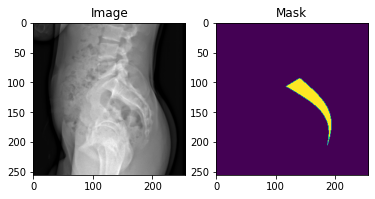

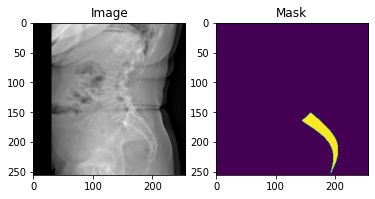

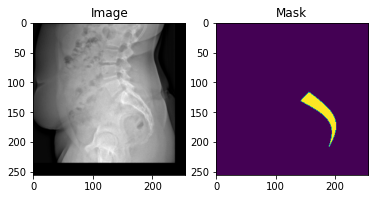

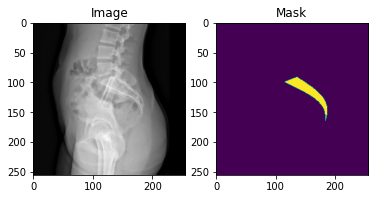

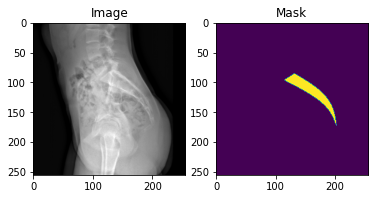

In [ ]:
for i in range(5):
  fig = plt.figure()
  plt.subplot(1, 2, 1)
  plt.imshow(X_images[i],cmap='gray')
  plt.title('Image')
  plt.subplot(1, 2, 2)
  plt.imshow(Y_masks[i])
  plt.title('Mask')
plt.show()

In [ ]:
X_images = X_images / 65535.0
X_images = np.expand_dims(X_images, -1)
Y_masks = np.expand_dims(Y_masks, -1)
print(X_images.shape)
print(Y_masks.shape)


(50, 256, 256, 1)
(50, 256, 256, 1)


## **Dataset**

**Create Training, Validation and Test Dataset**


In [ ]:
def augment_images(input_image,input_mask):
  
  # flipping random horizontal or vertical
  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_left_right(input_image)
    input_mask = tf.image.flip_left_right(input_mask)
  if tf.random.uniform(()) > 0.5:
    input_image = tf.image.flip_up_down(input_image)
    input_mask = tf.image.flip_up_down(input_mask)

  if tf.random.uniform(()) > 0.5:
    rot_factor = tf.cast(tf.random.uniform(shape=[], minval=-10, maxval=12, dtype=tf.int32), tf.float32)
    angle = np.pi/12*rot_factor
    input_image = tfa.image.rotate(input_image,angle)
    input_mask = tfa.image.rotate(input_mask,angle)
  
    return input_image, input_mask

In [ ]:
 if tf.random.uniform(()) > 0.5:
        input_image = tf.image.flip_left_right(input_image)
        input_mask = tf.image.flip_left_right(input_mask)

NameError: ignored

In [ ]:
X_images.shape

(50, 256, 256, 1)

In [ ]:
rot_factor = tf.cast(tf.random.uniform(shape=[], minval=-10, maxval=12, dtype=tf.int32), tf.float32)
print(rot_factor)

tf.Tensor(-2.0, shape=(), dtype=float32)


In [ ]:
tf.random.uniform(shape=[], minval=-1., maxval=1.)

<tf.Tensor: shape=(), dtype=float32, numpy=0.8204508>

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((X_images,Y_masks))
# buffer_size >= dataset_size
dataset = dataset.shuffle(buffer_size=340,reshuffle_each_iteration=False)

# define training, validation and test size
training_percentage = 80
validation_percentage = 15
test_percentage = 5

# training and validation
train_and_val = dataset.take(int(length*(training_percentage+validation_percentage)/100))
# testing
test = dataset.skip(int(length*(training_percentage+validation_percentage)/100))

# training
train = train_and_val.take(int(length*(training_percentage)/100))
# validation
val = train_and_val.skip(int(length*(training_percentage)/100))

print((train))

<TakeDataset shapes: ((256, 256, 1), (256, 256, 1)), types: (tf.float64, tf.float64)>


**Sample figure**

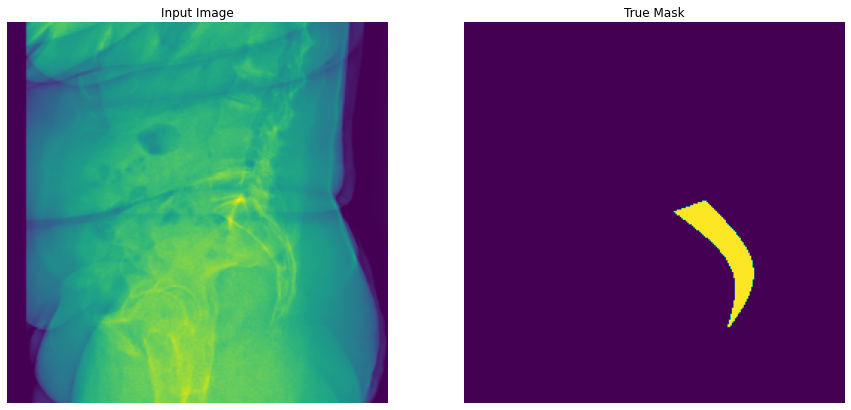

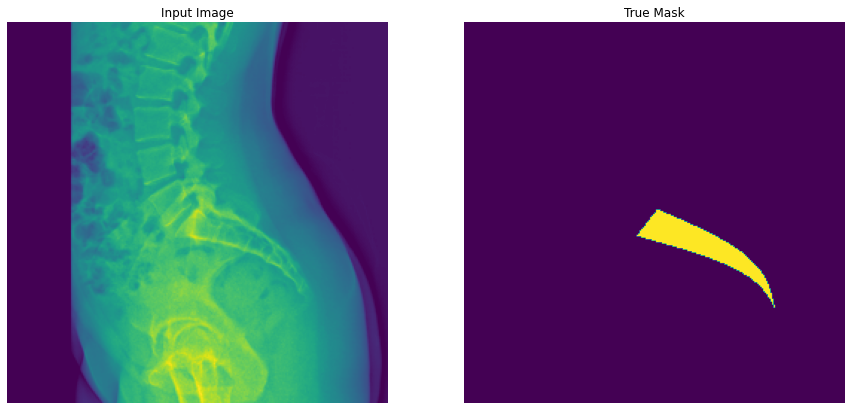

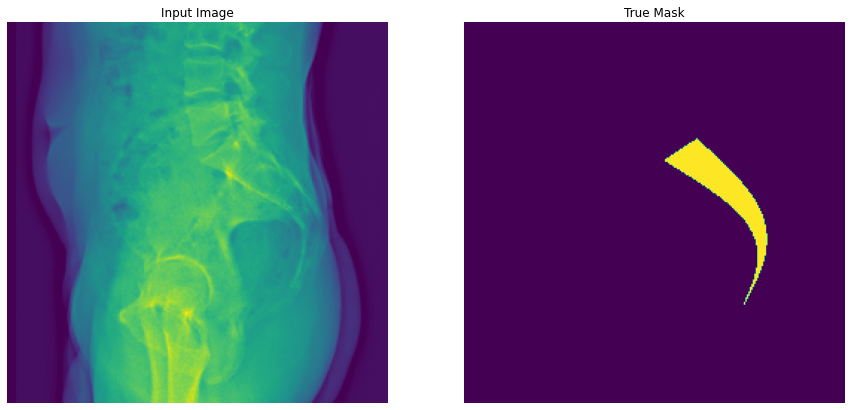

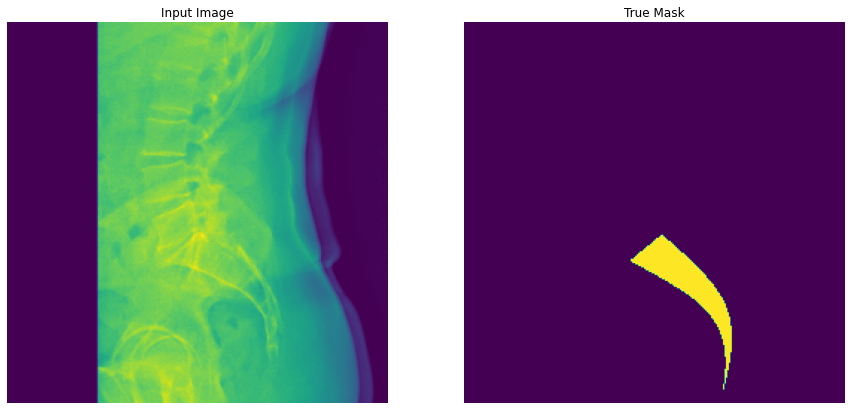

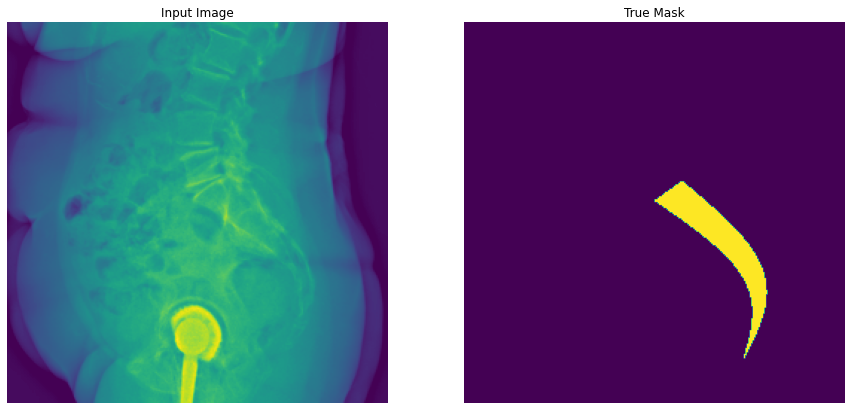

In [ ]:
for train_images, train_masks in train.take(5):
  sample_image, sample_mask = train_images, train_masks
  display([sample_image, sample_mask])

 # if this does not work, check if function "display" is loaded 

**Batch Datasets**

In [ ]:
BATCH_SIZE = round(X_images.shape[0] * training_percentage/100/20)

train_ds = train.batch(BATCH_SIZE).repeat()

# ACHTUNG BATCH SIZE
val_ds = val.batch(batch_size=round(X_images.shape[0]*validation_percentage/100)).repeat()
test_ds = test.batch(batch_size=1)

In [ ]:
round(X_images.shape[0] * training_percentage/100/20)

2

In [ ]:
round(X_images.shape[0]*validation_percentage/100)

8

**Augment Training Dataset**

In [ ]:
print(train.element_spec)
print(val.element_spec)
print(test.element_spec)

(TensorSpec(shape=(256, 256, 1), dtype=tf.float64, name=None), TensorSpec(shape=(256, 256, 1), dtype=tf.float64, name=None))
(TensorSpec(shape=(256, 256, 1), dtype=tf.float64, name=None), TensorSpec(shape=(256, 256, 1), dtype=tf.float64, name=None))
(TensorSpec(shape=(256, 256, 1), dtype=tf.float64, name=None), TensorSpec(shape=(256, 256, 1), dtype=tf.float64, name=None))


In [ ]:
print(train_ds.element_spec)
print(val_ds.element_spec)
print(test_ds.element_spec)

(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float64, name=None))
(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float64, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float64, name=None))
(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float64, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float64, name=None))


In [ ]:
train_ds.element_spec

(TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float64, name=None))

## **Model**

**Create Model**

In [ ]:
EPOCHS = 100   
STEPS_PER_EPOCH = 20
VALIDATION_STEPS = 1
LEARNING_RATE = 0.001

In [ ]:
# implement optimizer
OPTIMIZER=tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
    name='Adam'
)

In [ ]:
# Intersection over Union metrics
METRICS=[tf.keras.metrics.MeanIoU(num_classes=2)]

In [ ]:
model = create_model(input_shape=[target_height, target_width, 1])
model.compile(optimizer=OPTIMIZER,
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
              metrics=METRICS)

In [ ]:
model.summary()

In [ ]:
# Stop training if monitored metric does not improve within given epochs
callback_EarlyStopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

**Create prediction**

In [ ]:
show_predictions(train_ds,1)

NameError: ignored

## **Training**

**Train model**

In [ ]:
model_history = model.fit(train_ds, epochs=EPOCHS,
                          steps_per_epoch=STEPS_PER_EPOCH,
                          validation_steps=VALIDATION_STEPS,
                          validation_data=val_ds,
                          # callbacks=[DisplayCallback()]
                          # callbacks=[callback_EarlyStopping]
)

Epoch 1/100
20/20 [==============================] - 10s 251ms/step - loss: 0.4971 - mean_io_u: 0.4889 - val_loss: 0.2940 - val_mean_io_u: 0.4889
Epoch 2/100
20/20 [==============================] - 2s 80ms/step - loss: 0.2594 - mean_io_u: 0.4889 - val_loss: 0.1903 - val_mean_io_u: 0.4889
Epoch 3/100
20/20 [==============================] - 2s 79ms/step - loss: 0.1471 - mean_io_u: 0.4889 - val_loss: 0.1222 - val_mean_io_u: 0.4889
Epoch 4/100
20/20 [==============================] - 2s 80ms/step - loss: 0.1278 - mean_io_u: 0.4889 - val_loss: 0.1240 - val_mean_io_u: 0.4889
Epoch 5/100
20/20 [==============================] - 2s 79ms/step - loss: 0.1139 - mean_io_u: 0.4889 - val_loss: 0.1027 - val_mean_io_u: 0.4889
Epoch 6/100
20/20 [==============================] - 2s 81ms/step - loss: 0.1201 - mean_io_u: 0.4889 - val_loss: 0.1123 - val_mean_io_u: 0.4889
Epoch 7/100
20/20 [==============================] - 2s 79ms/step - loss: 0.1083 - mean_io_u: 0.4889 - val_loss: 0.0965 - val_mean_io_

**Plot loss**

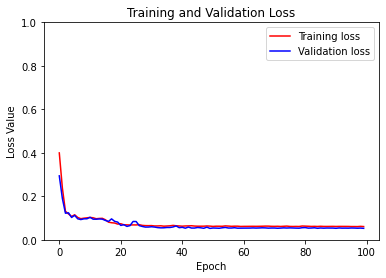

In [ ]:
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

epochs = range(EPOCHS)

plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()
plt.show()

# show loss and accuracy
# code from: https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/images/classification.ipynb#scrollTo=jWnopEChMMCn

## **Predictions**

**Make predictions**

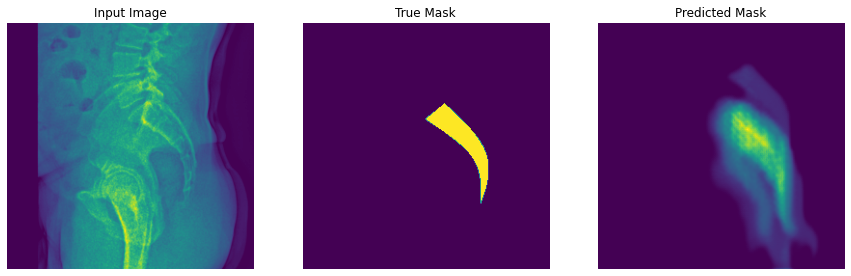

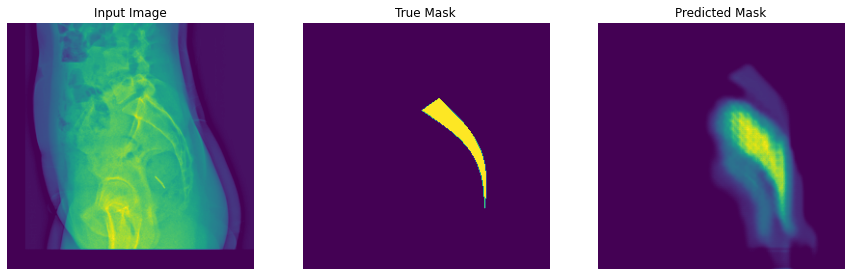

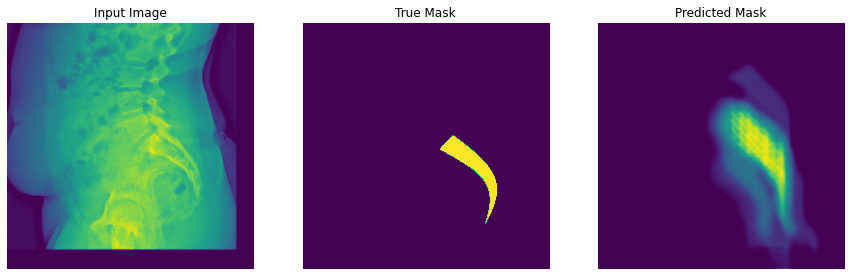

In [ ]:
show_predictions(test_ds,10)

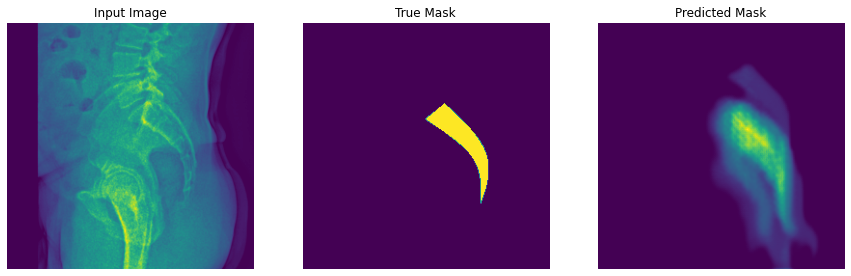

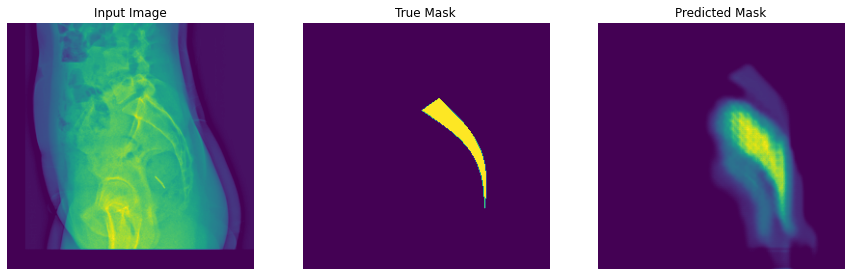

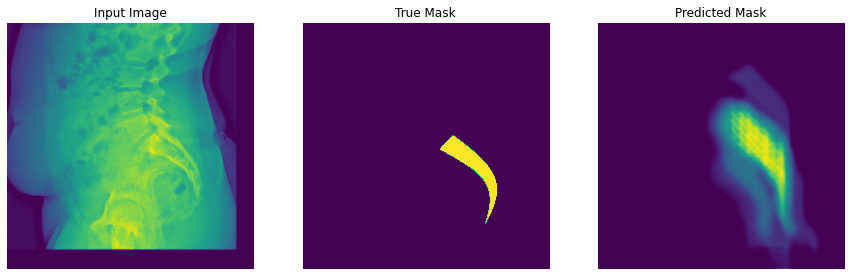

In [ ]:
show_predictions(test_ds,10)

***Extract predicted data***

In [ ]:
predictions_sacral_endplate = model.predict(test_ds)

In [ ]:
predictions_vertebra_endplate = model.predict(test_ds)

In [ ]:
predictions_sacral_endplate = np.squeeze(predictions_sacral_endplate,3)

In [ ]:
predictions_vertebra_endplate = np.squeeze(predictions_vertebra_endplate,3)

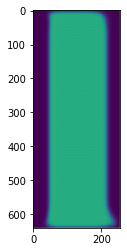

In [ ]:
plt.imshow(predictions_vertebra_endplate[5,:,:])

## **Export predictions to Matlab**

In [ ]:
test = predictions_sacral_endplate[1,:,:]
test.shape

(256, 256)

In [ ]:
savemat(os.path.join(export_path,'sacral_endplate_predictions_test.mat'),{'mydatatest':predictions_sacral_endplate})

# **Save and load model**

In [ ]:
# Save the complete model, including architecture, weights etc.
model.save('model_sacrum_sagital.h5')

In [ ]:
# Save the weights
model.save_weights('drive/My Drive/UNet Files/Sacrum Weights')

In [ ]:
# Load the weights
model.load_weights('drive/My Drive/UNet Files/Sacrum Weights/')

OSError: ignored

# **Prediction data**

## **Preparing**

**Clear**

In [ ]:
del X_images

NameError: ignored

**Import functions**

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import os
import cv2
import scipy.io as sio
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle as pickle
import collections
import glob
import tensorflow.keras.backend as kb
from scipy.io import savemat
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
from IPython.display import clear_output
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, MaxPool2D, Conv2DTranspose, concatenate, Input, Dropout

**Define functions**

In [ ]:
def create_model(input_shape,
           img_chan=1, activation = 'sigmoid', initializer = 'he_normal', dropout = 0.5):
    
    '''Create a Standard U-Net
  
    Args:
      img_width:  Width of the Input Image
      img_height: Height of the Input Image
      img_chan: Number of Input Channels
      activation:  activation function
  
    Return:
      Keras Model 
  
    '''
    img_width = input_shape[0]
    img_height = input_shape[1]
    inputs = Input((img_width, img_height, img_chan)) 
      
    
      # Contraction path
    inc_c1 = inception_module(inputs, 32, 32, 16, 64, 32, 16, initializer)
    c1 = Conv2D(32, (3,3), activation='relu', kernel_initializer=initializer, padding = 'same')(inc_c1)
    c1 = Dropout(dropout)(c1)
    c1 = Conv2D(32, (3,3), activation='relu', kernel_initializer=initializer, padding = 'same')(c1)
    p1 = MaxPool2D((2,2))(c1)

    inc_c2 = inception_module(p1, 16, 16, 8, 32, 16, 16, initializer)
    c2 = Conv2D(64, (3,3), activation = 'relu', kernel_initializer = initializer, padding='same')(inc_c2)
    c2 = Dropout(dropout)(c2) #TODO: this was not part of architectur from ishaan, why??
    c2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c2)
    p2 = MaxPool2D((2, 2))(c2)
  
    inc_c3 = inception_module(p2, 16, 16, 8, 32, 16, 16, initializer)
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(inc_c3)
    c3 = Dropout(dropout)(c3)
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c3)
    p3 = MaxPool2D((2, 2))(c3)
   
    inc_c4 = inception_module(p3,16, 16, 8, 32, 16, 16, initializer)
    c4 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(inc_c4)
    c4 = Dropout(dropout)(c4)
    c4 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c4)
    p4 = MaxPool2D(pool_size=(2, 2))(c4)
   
    inc_c5 = inception_module(p4,16, 16, 8, 32, 16, 16, initializer)
    c5 = Conv2D(512, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(inc_c5)
    c5 = Dropout(dropout)(c5)
    c5 = Conv2D(512, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c5)
    inc_c6 = inception_module(c5, 16, 16, 8, 32, 16, 16, initializer)
    
    
    #Expansive path
    
    u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(inc_c6)
    u6 = concatenate([u6, inc_c4])
    c6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u6)
    c6 = Dropout(dropout)(c6)
    c6 = Conv2D(256, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c6)
    inc_c7 = inception_module(c6, 16, 16, 8, 32, 16, 16, initializer)
  
    u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(inc_c7)
    u7 = concatenate([u7, inc_c3])
    c7 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u7)
    c7 = Dropout(dropout)(c7)
    c7 = Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c7)
    inc_c8 = inception_module(c7, 16, 16, 8, 32, 16, 16, initializer)
  
    u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(inc_c8)
    u8 = concatenate([u8, inc_c2])
    c8 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u8)
    c8 = Dropout(dropout)(c8)
    c8 = Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c8)
    inc_c9 = inception_module(c8, 16, 16, 8, 32, 16, 16, initializer)
  
    u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(inc_c9)
    u9 = concatenate([u9, inc_c1], axis=3)
    c9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(u9)
    c9 = Dropout(dropout)(c9)
    c9 = Conv2D(32, (3, 3), activation='relu', kernel_initializer=initializer, padding='same')(c9)
   
    outputs = Conv2D(1, (1, 1), activation=activation)(c9)
  
    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  
    return model

def inception_module(x, filters_1x1, filters_3x3_reduce, filters_3x3,
                     filters_5x5_reduce, filters_5x5, filters_pool_proj,
                     initializer):
  
    '''Create an Inception Module
  
      Args:
        x: Input
        filters_1x1: Num of 1x1 filters
        filters_3x3_reduce: Number of 3x3 reduction filters
        filters_3x3: Number of 3x3 filters
        filters_5x5_reduce: Number of 5x5 reduction filters
        filters_5x5: Number of 5x5 filters
        filters_pool_proj: Number of MaxPooling Opertions
  
      Returns:
        output: Concatenated Inception Module
  
    '''
    conv_1x1 = Conv2D(filters_1x1, (1,1), padding='same', activation='relu',
                        kernel_initializer=initializer)(x)
  
    # #reduce the feature space
    # conv_3x3 = Conv2D(filters_3x3_reduce, (1,1), padding='same', 
    #                     activation='relu', kernel_initializer=initializer)(x)
    # conv_3x3 = Conv2D(filters_3x3, (3,3), padding='same', activation='relu',
                        # kernel_initializer=initializer)(conv_3x3)
      
    #reduce the feature space
    conv_5x5 = Conv2D(filters_5x5_reduce, (1,1), padding='same', 
                        activation='relu', kernel_initializer=initializer)(x)
    conv_5x5 = Conv2D(filters_5x5, (5,5), padding='same', activation='relu',
                        kernel_initializer=initializer)(conv_5x5)
      
    # pool_proj = MaxPool2D((3,3), strides=(1,1), padding = 'same')(x)
    # pool_proj = Conv2D(filters_pool_proj, (1,1), padding = 'same', 
    #                      activation = 'relu', kernel_initializer = initializer)(pool_proj)
      
    output = concatenate([conv_1x1,conv_5x5], axis = 3)  #???: why only concatenate conv1 and conv5, what about conv3 and pool?
      
    return output

In [ ]:
# plot a sample image and mask
def display_without_mask(display_list):
  plt.figure(figsize=(15, 15))

  title = ['Input Image', 'Predicted Mask']

  for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(title[i])
    plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
    plt.axis('off')
  plt.show()

In [ ]:
# create and plot prediction mask
def create_mask(pred_mask):
  # pred_mask = tf.argmax(pred_mask, axis=-1)
  # pred_mask = pred_mask[..., tf.newaxis]
  pred_mask[pred_mask >= 0.2] = 1
  pred_mask[pred_mask < 0.2] = 0

  return pred_mask[0]

def show_predictions_without_mask(dataset=None, num=1):
  if dataset:
    for images in dataset.take(num):
      pred_mask = model.predict(images)
      display_without_mask([images[0], create_mask(pred_mask)])
  else:
    display_without_mask([sample_image, sample_mask,
             create_mask(model.predict(sample_image[tf.newaxis, ...]))])

## **Mount Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

## **Preprocessing**

**Import prediction data**

In [ ]:
# get folder from google drive
folder_path = 'drive/My Drive/Masterarbeit/MATLAB/Mask files/Test images 1000-1037/'
files = os.listdir(folder_path)
len(files)

37

In [ ]:
# load spine images and resize/crop them to target size

# define target image size
input_height = 640
input_width = 256
scaling_factor = 1
# calculate target image size
target_height = int(input_height/scaling_factor)
target_width = int(input_width/scaling_factor)
length = len(files)

# create empty arrays for resized image
X_images = np.empty((length, target_height, target_width))
Y_masks = np.empty((length, target_height, target_width))
nifti_index = np.empty((length))

for k in range(length):
    data = sio.loadmat(os.path.join(folder_path, files[k]))
    image = data['d_spine_resized_sagital']

    dim = (target_width, target_height)
        
    resized_image = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
        
    X_images[k]  = resized_image
    print(k)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36


In [ ]:
# load sacral endplate images

# define target image size
input_height = 256
input_width = 256
scaling_factor = 1
# calculate target image size
target_height = int(input_height/scaling_factor)
target_width = int(input_width/scaling_factor)
length = len(files)

# create empty arrays for images
X_images = np.empty((length, target_height, target_width))
nifti_index = np.empty((length))

for k in range(length):
    data = sio.loadmat(os.path.join(folder_path, files[k]))
    image = data['d_sacral_endplate_resized_sagital']

    X_images[k]  = image
    print(k)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [ ]:
# load femur head images

# define target image size
input_height = 256
input_width = 256
scaling_factor = 1
# calculate target image size
target_height = int(input_height/scaling_factor)
target_width = int(input_width/scaling_factor)
length = len(files)

# create empty arrays for images
X_images = np.empty((length, target_height, target_width))
nifti_index = np.empty((length))

for k in range(length):
    data = sio.loadmat(os.path.join(folder_path, files[k]))
    image = data['d_femur_head_resized_sagital']

    X_images[k]  = image
    print(k)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

**Sample figure**

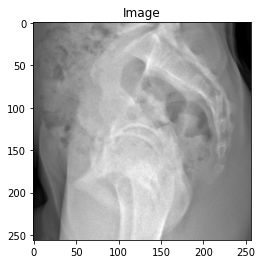

In [ ]:
for i in range(1):
  fig = plt.figure()
  plt.imshow(X_images[i],cmap='gray')
  plt.title('Image')
plt.show()

In [ ]:
X_images = X_images / 65535.0
X_images = np.expand_dims(X_images, -1)
X_images.shape

(37, 640, 256, 1)

## **Dataset**

**Create Test Dataset**

In [ ]:
pred = tf.data.Dataset.from_tensor_slices((X_images))

**Sample figure**

In [ ]:
for train_images, train_masks in pred_ds.take(1):
  sample_image, sample_mask = train_images, train_masks
  display([sample_image, sample_mask])

ValueError: ignored

**Batch Dataset**

In [ ]:
pred_ds = pred.batch(batch_size=1)

In [ ]:
pred_ds.element_spec

TensorSpec(shape=(None, 640, 256, 1), dtype=tf.float64, name=None)

## **Model**

**Create Model**

In [ ]:
LEARNING_RATE = 0.0005

In [ ]:
# implement optimizer
optimizer=tf.keras.optimizers.Adam(
    learning_rate=LEARNING_RATE, beta_1=0.9, beta_2=0.999, epsilon=1e-07, amsgrad=False,
    name='Adam'
)

In [ ]:
model = create_model(input_shape=[target_height, target_width, 1])
model.compile(optimizer=optimizer,
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=False),
              metrics=['accuracy'])

**Load saved weights**

In [ ]:
# Load the weights
model.load_weights('drive/My Drive/Masterarbeit/Google Colab Notebooks/checkpoints/femur_head_sagital_tvt802000_with_294_data_lr001')

## **Predictions**

**Make predictions**

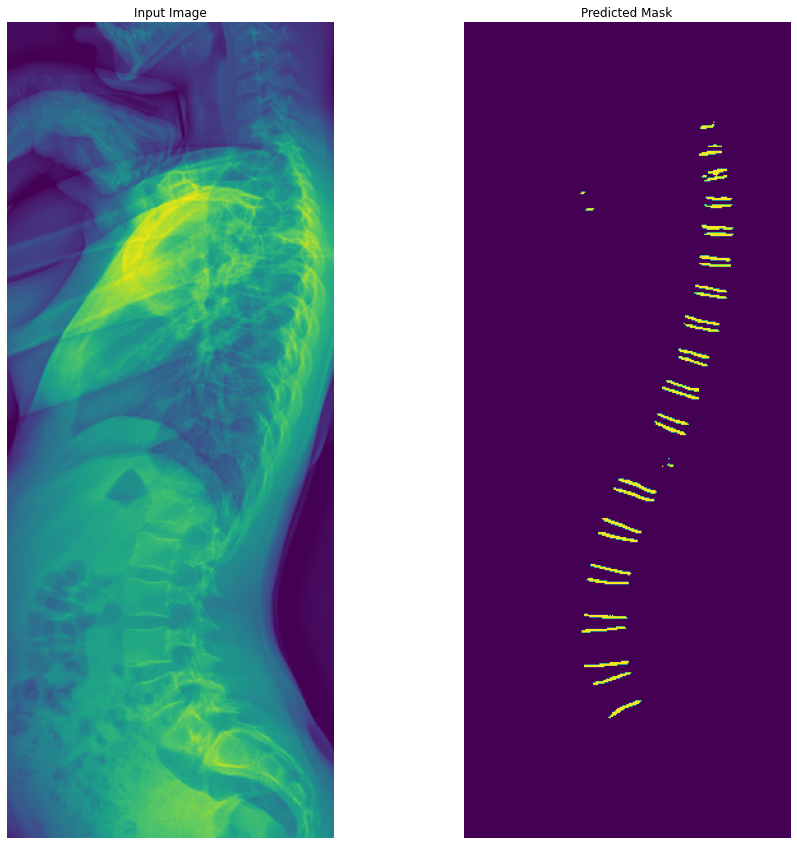

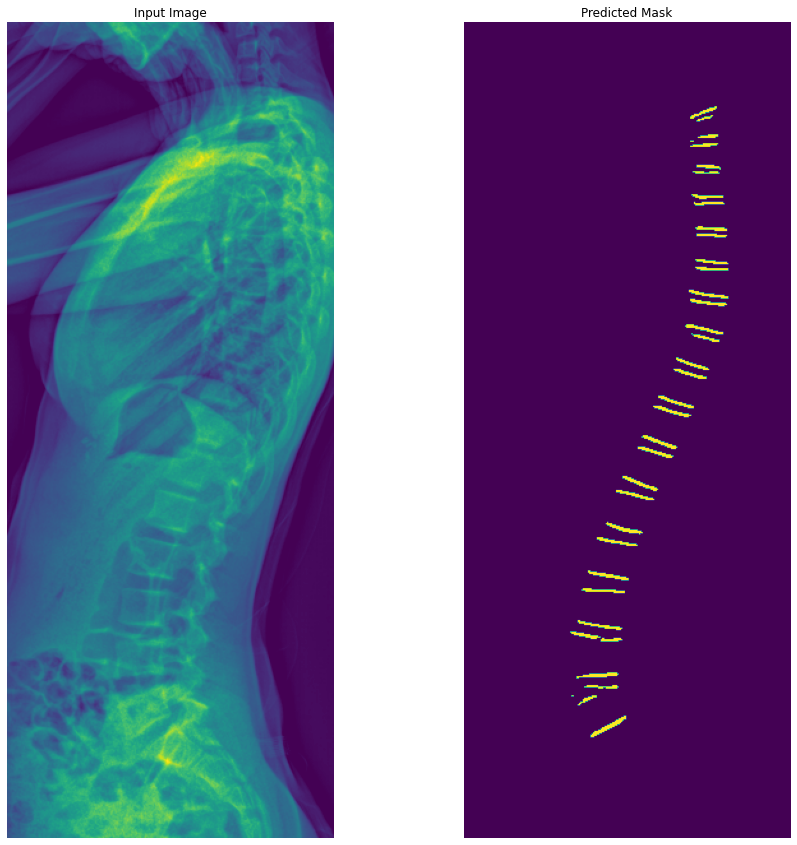

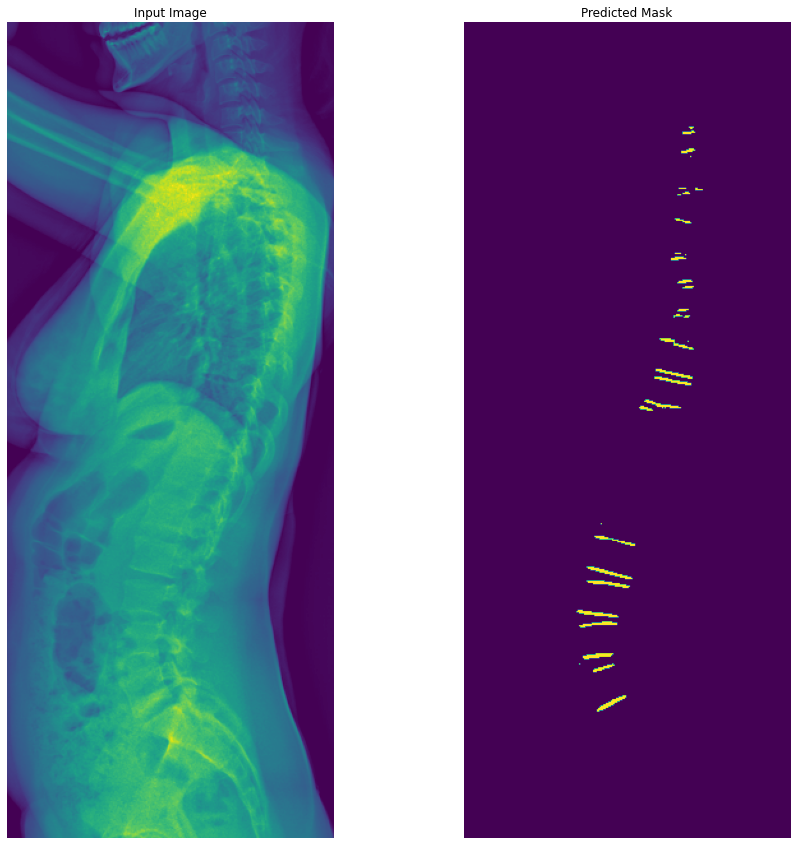

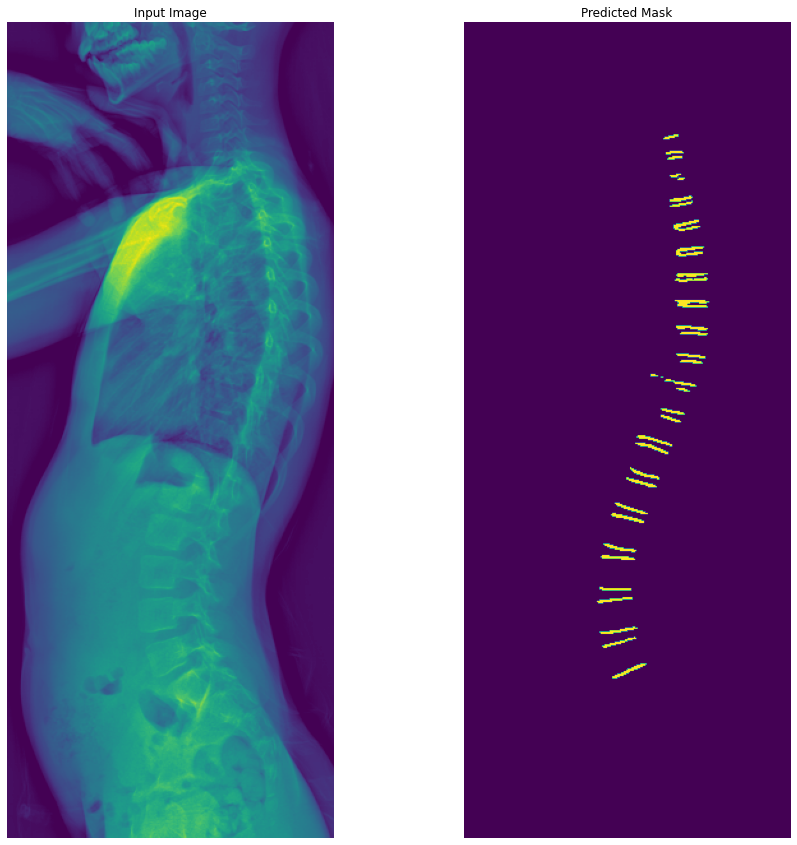

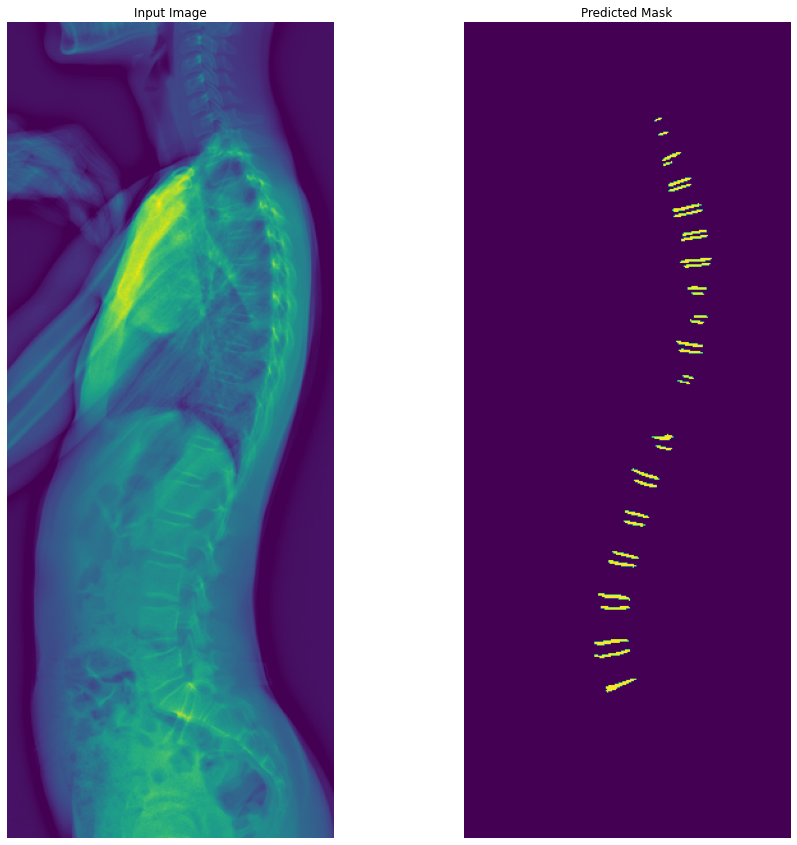

...

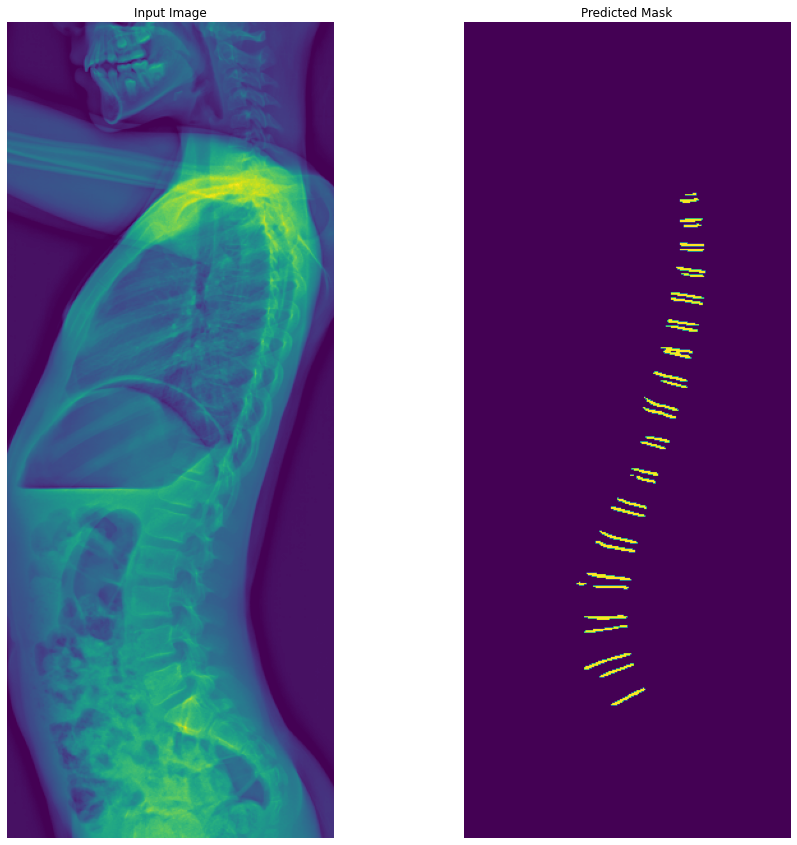

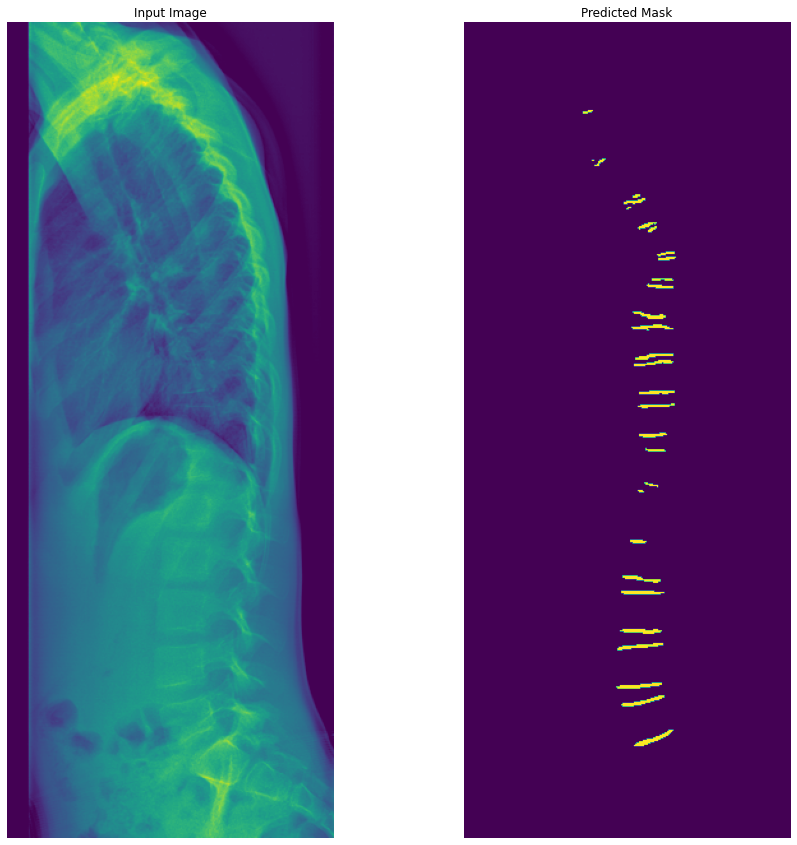

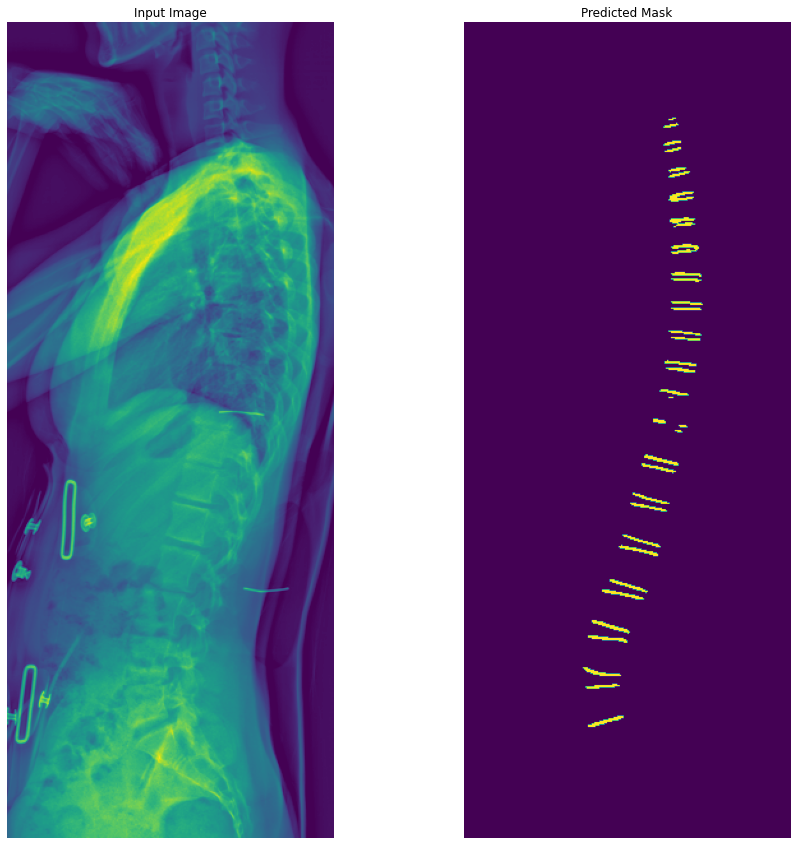

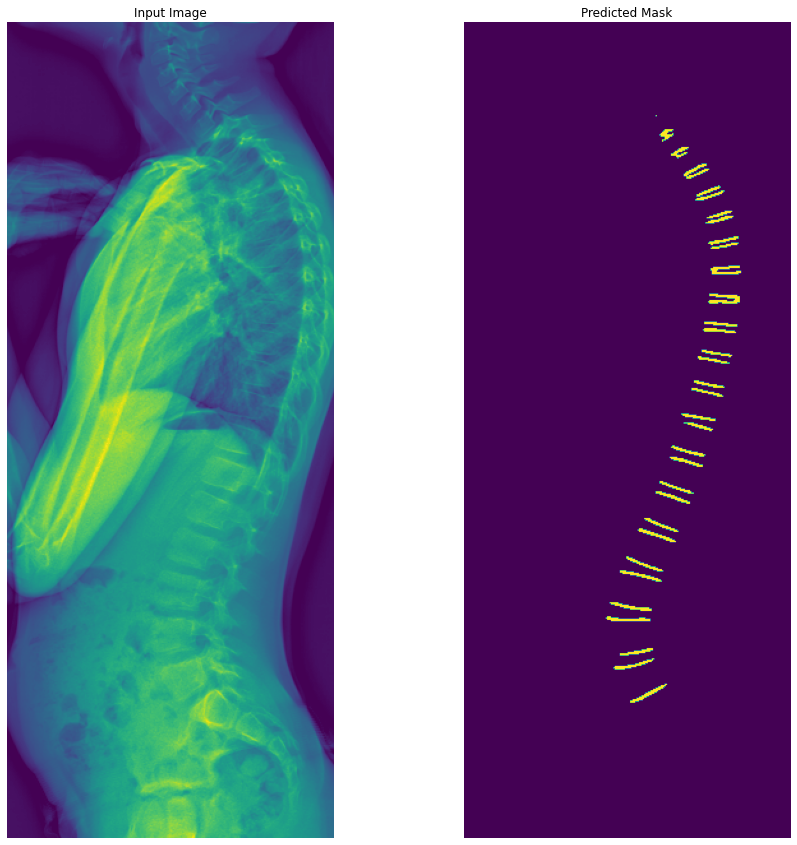

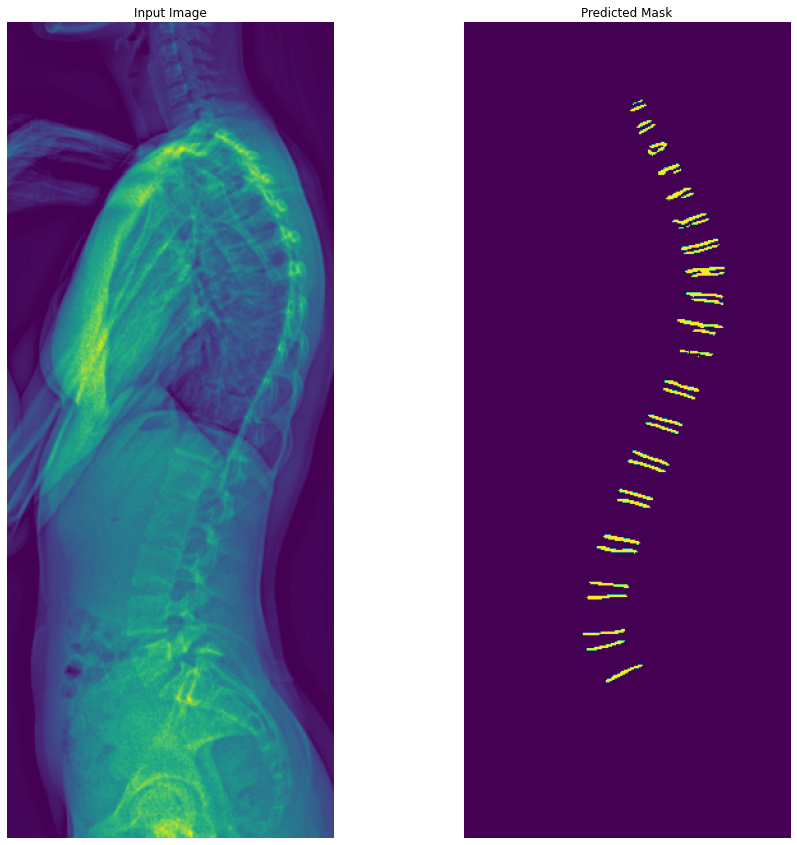

In [ ]:
# show predictions
show_predictions_without_mask(pred_ds,37)

In [ ]:
# get spine predictions for the prediction dataset
predictions_spine = model.predict(pred_ds)
# squeeze last dimension
predictions_spine = np.squeeze(predictions_spine,3)
predictions_spine.shape
# save all predictions in a mat file
export_path = 'drive/My Drive/Masterarbeit/Google Colab Notebooks/Exports/'
savemat(os.path.join(export_path,'spine_predictions with 296 training data 1000-1037.mat'),{'predictions':predictions_spine})
# savemat(os.path.join(export_path,'spine_predictions with 296 training data 0000-0400.mat'),{'predictions':predictions_spine})

In [ ]:
# get vertebra predictions for the prediction dataset
predictions_vertebra = model.predict(pred_ds)
# squeeze last dimension
predictions_vertebra = np.squeeze(predictions_vertebra,3)
predictions_vertebra.shape
# save all predictions in a mat file
export_path = 'drive/My Drive/Masterarbeit/Google Colab Notebooks/Exports/'
savemat(os.path.join(export_path,'vertebra_predictions with 340 training data 1000-1037.mat'),{'predictions':predictions_vertebra})
# savemat(os.path.join(export_path,'vertebra_predictions with 340 training data 0000-0400.mat'),{'predictions':predictions_vertebra})

In [ ]:
# get sacral endplate predictions for the prediction dataset
predictions_sacral_endplate = model.predict(pred_ds)
# squeeze last dimension
predictions_sacral_endplate = np.squeeze(predictions_sacral_endplate,3)
predictions_sacral_endplate.shape
# save all predictions in a mat file
export_path = 'drive/My Drive/Masterarbeit/Google Colab Notebooks/Exports/'
# savemat(os.path.join(export_path,'sacral_endplate_predictions2 with 296 training data 1000-1037.mat'),{'predictions':predictions_sacral_endplate})
savemat(os.path.join(export_path,'sacral_endplate_predictions with 296 training data 0000-0400.mat'),{'predictions':predictions_spine})

In [ ]:
# get femur head predictions for the prediction dataset
predictions_femur_head = model.predict(pred_ds)
# squeeze last dimension
predictions_femur_head = np.squeeze(predictions_femur_head,3)
predictions_femur_head.shape
# save all predictions in a mat file
export_path = 'drive/My Drive/Masterarbeit/Google Colab Notebooks/Exports/'
# savemat(os.path.join(export_path,'femur_head_predictions with 296 training data 1000-1037.mat'),{'predictions':predictions_femur_head})
savemat(os.path.join(export_path,'femur_head_predictions with 296 training data 0000-0400.mat'),{'predictions':predictions_spine})

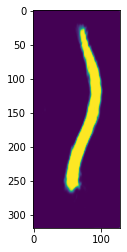

In [ ]:
plt.imshow(predictions_spine[0,:,:])